In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import re 
from sklearn.model_selection import train_test_split

In [2]:
from google.colab import files
files.upload()

Saving test.csv to test.csv
Saving train.csv to train.csv


{'test.csv': b'Phrase\r\nAn intermittently pleasing but mostly routine effort .\r\nAn intermittently pleasing but mostly routine effort\r\nAn\r\nintermittently pleasing but mostly routine effort\r\nintermittently pleasing but mostly routine\r\nintermittently pleasing but\r\nintermittently pleasing\r\nintermittently\r\npleasing\r\nbut\r\nmostly routine\r\nmostly\r\nroutine\r\neffort\r\n.\r\n"Kidman is really the only thing that \'s worth watching in Birthday Girl , a film by the stage-trained Jez Butterworth -LRB- Mojo -RRB- that serves as yet another example of the sad decline of British comedies in the post-Full Monty world ."\r\nKidman\r\n"is really the only thing that \'s worth watching in Birthday Girl , a film by the stage-trained Jez Butterworth -LRB- Mojo -RRB- that serves as yet another example of the sad decline of British comedies in the post-Full Monty world ."\r\n"is really the only thing that \'s worth watching in Birthday Girl , a film by the stage-trained Jez Butterworth

In [3]:
train=pd.read_csv('train.csv')
test=pd.read_csv('test.csv')

In [4]:
from transformers import XLNetTokenizer, XLNetForSequenceClassification
import torch

In [4]:
pip install transformers

     |████████████████████████████████| 2.1MB 8.4MB/s 
     |████████████████████████████████| 890kB 41.2MB/s 
     |████████████████████████████████| 3.2MB 24.4MB/s 
  Created wheel for sacremoses: filename=sacremoses-0.0.43-cp37-none-any.whl size=893262 sha256=1e5d92a02f0df67382e789301a7cd7df9c22e11e909bf7cc09e98bd83b4e0239
  Stored in directory: /root/.cache/pip/wheels/29/3c/fd/7ce5c3f0666dab31a50123635e6fb5e19ceb42ce38d4e58f45
Successfully built sacremoses


In [5]:
train=pd.read_csv('train.csv')
test=pd.read_csv('test.csv')

In [6]:
train.tail(6)

,Phrase,Sentiment
156054,Hearst 's forced avuncular chortles,2
156055,Hearst 's,2
156056,forced avuncular chortles,1
156057,avuncular chortles,3
156058,avuncular,2
156059,chortles,2


In [7]:
test.tail(6)

,Phrase
66285,Gutterball
66286,"A long-winded , predictable scenario ."
66287,"A long-winded , predictable scenario"
66288,"A long-winded ,"
66289,A long-winded
66290,predictable scenario


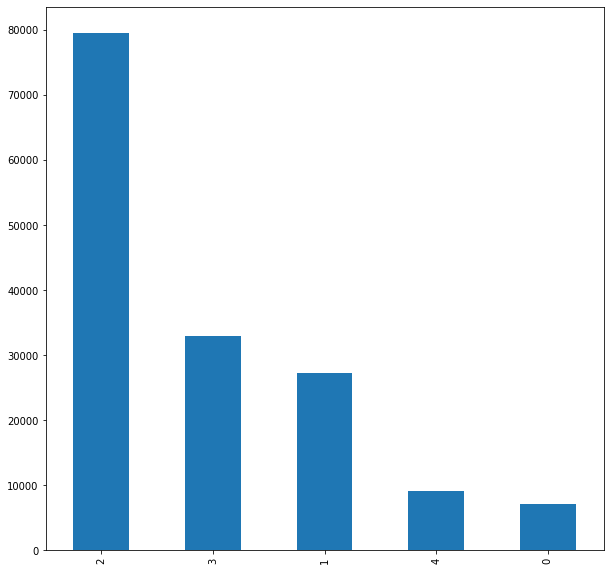

In [8]:
train['Sentiment'].value_counts().plot(kind='bar', figsize=(10,10))

In [9]:
def cleaning(Inpdata):
    cleanedArticle1=re.sub(r'\\[?|$|(),"".@#=><|!]Â&*/-',r' ',Inpdata)
    cleanedArticle2=re.sub(r'https?://\S+|www\.\S+',r' ',cleanedArticle1)
    cleanedArticle3=re.sub(r'\b\w{1,2}\b', ' ',cleanedArticle2)
    cleanedArticle4=re.sub(r' +', ' ',cleanedArticle3)
    cleanedArticle5=re.sub(r'[^a-z A-Z]',r' ',cleanedArticle4)
    cleanedArticle6=cleanedArticle5.replace("  ", "")
    cleanedArticle7=cleanedArticle6.lower()
    return(cleanedArticle7)

In [10]:
train['text_clean']=train['Phrase'].apply(cleaning)

test['text_clean']=test['Phrase'].apply(cleaning)

In [11]:
train=train.drop(labels=['Phrase'], axis=1)

test=test.drop(labels=['Phrase'], axis=1)

In [12]:
train_df,eval_df=train_test_split(train,test_size=0.30, random_state=5402)

In [13]:
Train_text = []
Train_target=[]

for Item1,Item2 in zip(train_df['text_clean'],train_df['Sentiment']):
    Train_text.append(Item1)
    Train_target.append(Item2)

eval_text = []
eval_target=[]
for Item1,Item2 in zip(eval_df['text_clean'],eval_df['Sentiment']):
    eval_text.append(Item1)
    eval_target.append(Item2)

In [14]:
X_train=Train_text
X_test= eval_text

y_train=Train_target
y_test=eval_target

In [15]:
len(X_train),len(y_train) ,len(X_test),len(y_test)

(109242, 109242, 46818, 46818)

In [18]:
sentiments=train['Sentiment'].unique()

In [24]:
import ktrain
from ktrain import text

In [19]:
model_name='xlnet-base-cased'

trans=text.Transformer(model_name,maxlen=512,class_names=sentiments)

In [20]:
train_data=trans.preprocess_train(X_train,y_train)

test_data=trans.preprocess_train(X_test,y_test)

preprocessing train...
language: en
train sequence lengths:
	mean : 5
	95percentile : 16
	99percentile : 23


Is Multi-Label? False
preprocessing train...
language: en
train sequence lengths:
	mean : 5
	95percentile : 16
	99percentile : 23


Is Multi-Label? False


In [22]:
model=trans.get_classifier()

In [1]:
learner=ktrain.get_learner(model,train_data=train_data,val_data=test_data,batch_size=4)
learner.fit_onecycle(0.012563,epochs=2)


NameError: ignored

In [ ]:
predictor=ktrain.get_predictor(learner.model,preproc=trans)
pred_eval=predictor.predict(X_test)
predictor.save('XLNET.h5')

In [ ]:
" Cannot Train Session crashed multiple times reduced batch size 16 to 4"